In [1]:
import os
PROJECT_HOME = 'C:\\Users\\reinhard_steffens\\Dropbox\\Udacity\\CarND-Advanced-Lane-Lines'
TEST_IMG_DIR = os.path.join(PROJECT_HOME, 'test_images')
OUT_IMG_DIR = os.path.join(PROJECT_HOME, 'output_images')
CAMERA_CAL_DIR = os.path.join(PROJECT_HOME, 'camera_cal')
VIDEO_1 = os.path.join(PROJECT_HOME, 'project_video.mp4')
VIDEO_2 = os.path.join(PROJECT_HOME, 'challenge_video.mp4')
VIDEO_3 = os.path.join(PROJECT_HOME, 'harder_challenge_video.mp4')
import glob

In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle


# Camera Calibration

In [3]:
listCalibrationPics = glob.glob(os.path.join(CAMERA_CAL_DIR, '*.jpg'))

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration1.jpg
Can't find corners for C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration1.jpg
C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration10.jpg


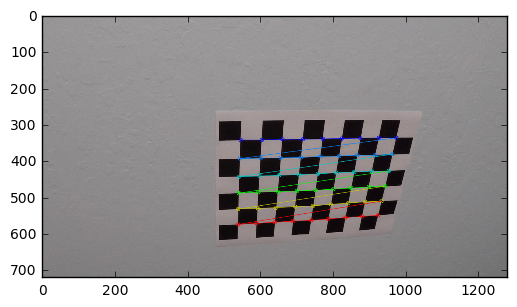

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration11.jpg


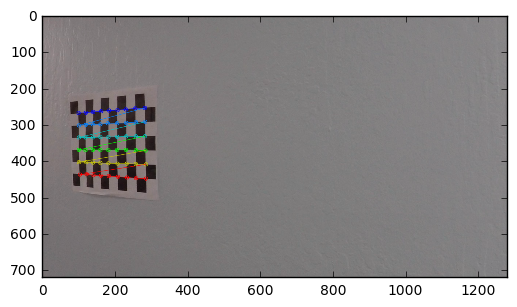

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration12.jpg


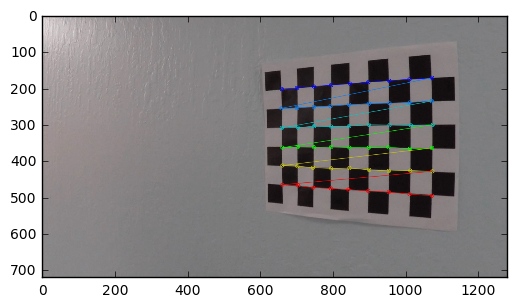

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration13.jpg


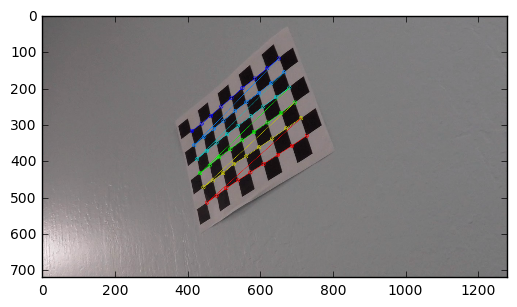

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration14.jpg


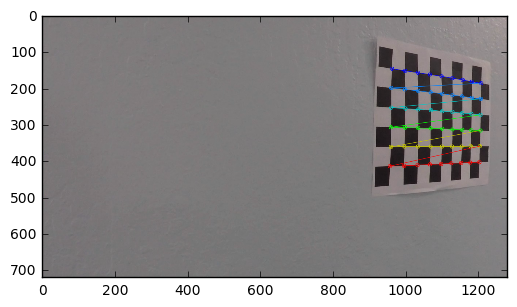

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration15.jpg


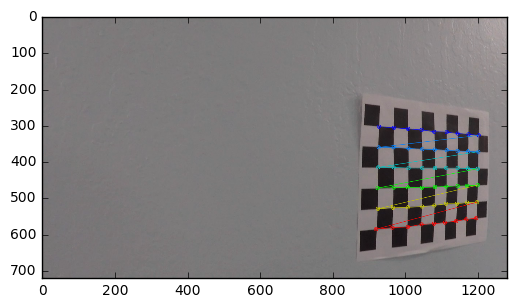

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration16.jpg


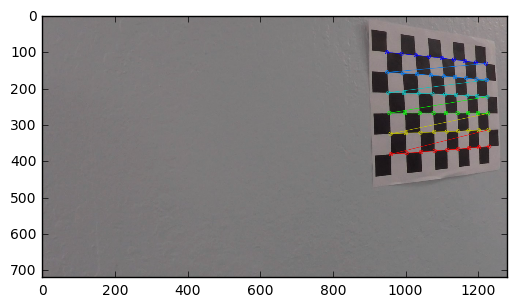

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration17.jpg


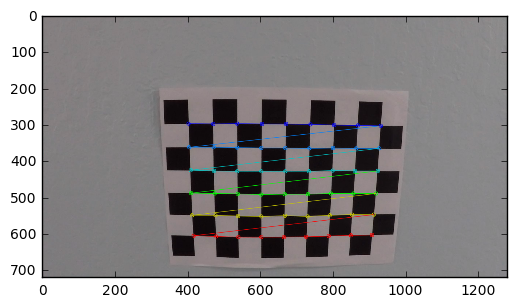

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration18.jpg


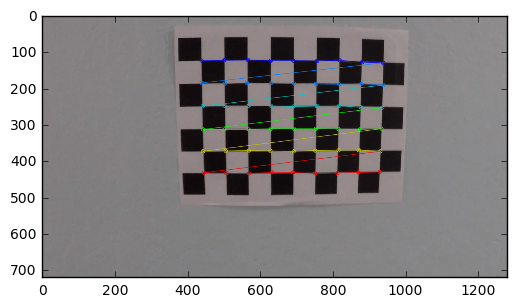

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration19.jpg


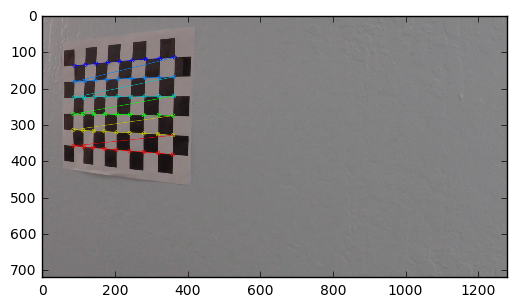

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration2.jpg


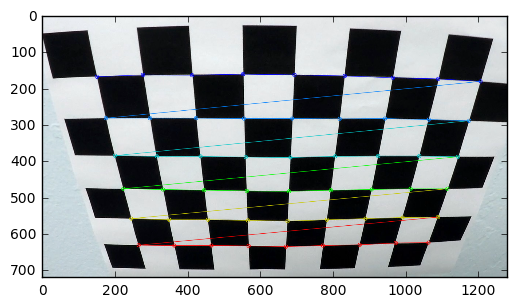

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration20.jpg


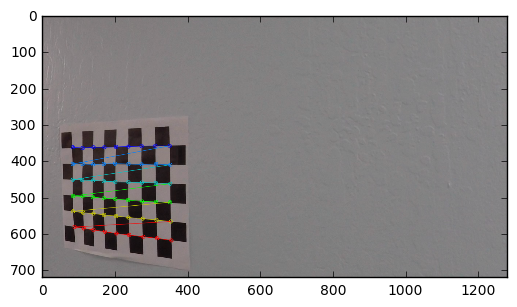

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration3.jpg


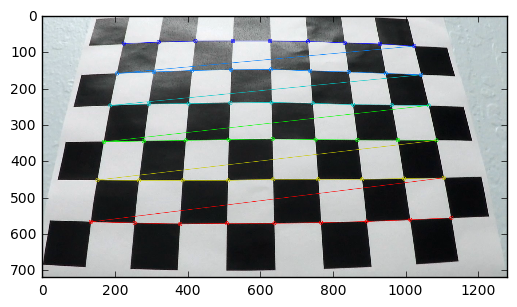

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration4.jpg
Can't find corners for C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration4.jpg
C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration5.jpg
Can't find corners for C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration5.jpg
C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration6.jpg


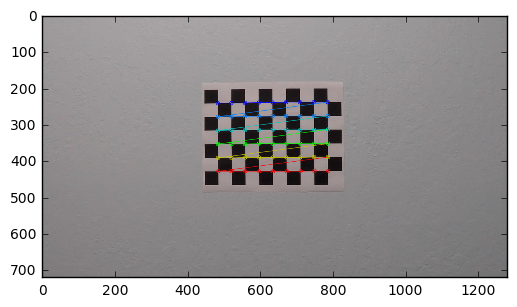

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration7.jpg


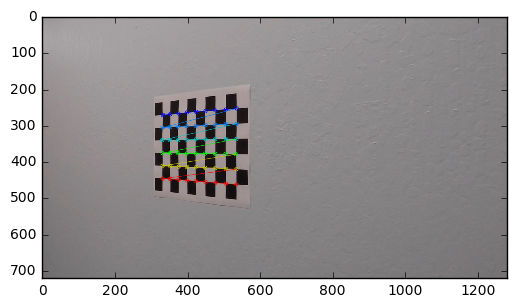

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration8.jpg


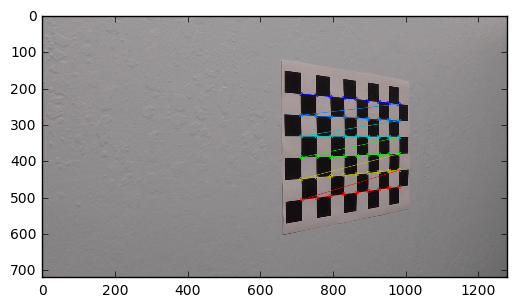

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\camera_cal\calibration9.jpg


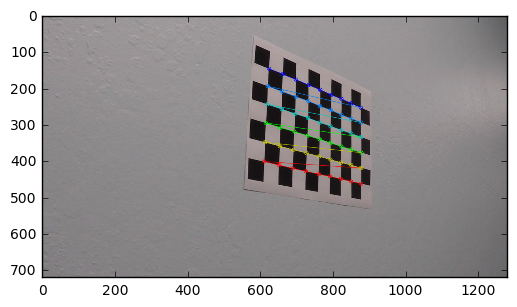

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# prepare object points
nx = 9 # enter the number of inside corners in x
ny = 6 # enter the number of inside corners in y

dictCorners = dict()

objpoints = []
imgpoints = []

objp = np.zeros((ny*nx, 3), np.float32)
objp[:,:2] = np.mgrid[0:nx, 0:ny].T.reshape(-1,2)

# loop over all calibration pics
for pic in listCalibrationPics:
    print(pic)
    # Make a list of calibration images
    img = cv2.imread(pic)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)

    # If found, draw corners
    if ret == True:
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
        plt.imshow(img)
        plt.show()
        dictCorners[pic] = corners
        imgpoints.append(corners)
        objpoints.append(objp)
    else:
        dictCorners[pic] = None
        print("Can't find corners for %s" % (pic))

## Test Calibration

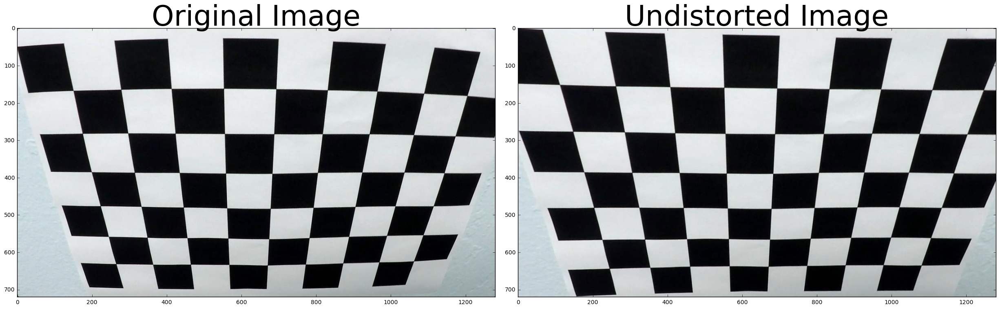

In [5]:
# Read in an image
img = cv2.imread(os.path.join(PROJECT_HOME, 'camera_cal', 'calibration2.jpg'))

# function that takes an image, object points, and image points
# performs the camera calibration, image distortion correction and 
# returns the undistorted image
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera and cv2.undistort()
    #undist = np.copy(img)  # Delete this line
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2],None,None)
    undist = cv2.undistort(img, mtx, dist, None, None)
    return undist

undistorted = cal_undistort(img, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

## Save Calibration Coefficients

In [6]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[0:2],None,None)
# use with cv2.undistort(img, mtx, dist, None, None)

# Color Gradient Threshold


In [7]:
def color_thrsh(img, sx_thresh=(20,100), s_thresh=(170, 255)):
    # Convert to HLS color space and separate the S channel
    # img is the undistorted image
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h_channel = hls[:,:,0] # not used
    l_channel = hls[:,:,1] # not used
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(h_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    # Stack each channel
    # Note color_binary[:, :, 0] is all 0s, effectively an all black image. It might
    # be beneficial to replace this channel with something else.
    color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)] = 1
    
    return color_binary, combined_binary



## Save Threshold Coefficients

In [8]:
sx_thresh = (40 , 100)
s_thresh  = (180, 255)

## Test the Color Threshold

In [9]:
def test_thrsh(img, sx_thresh=(20,100), s_thresh=(170, 255)):
    color_binary, combined_binary = color_thrsh(img, sx_thresh, s_thresh)
    
    # Plotting thresholded images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8))
    ax1.set_title('Original')
    ax1.imshow(img)

    ax2.set_title('Stacked thresholds')
    ax2.imshow(color_binary)

    ax3.set_title('Combined S channel and gradient thresholds')
    ax3.imshow(combined_binary, cmap='gray')
    plt.show()

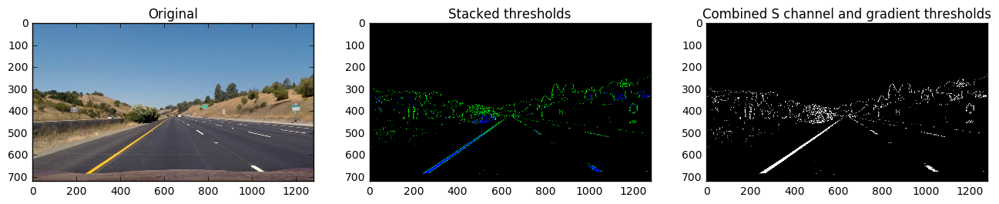

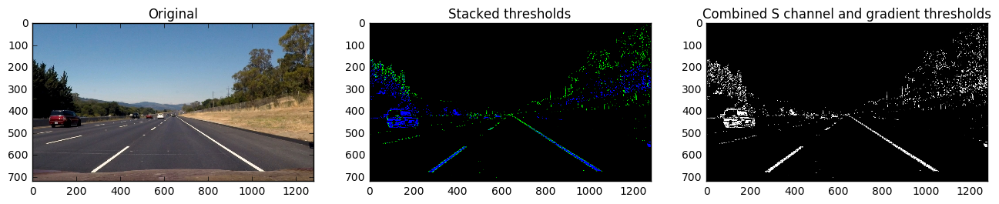

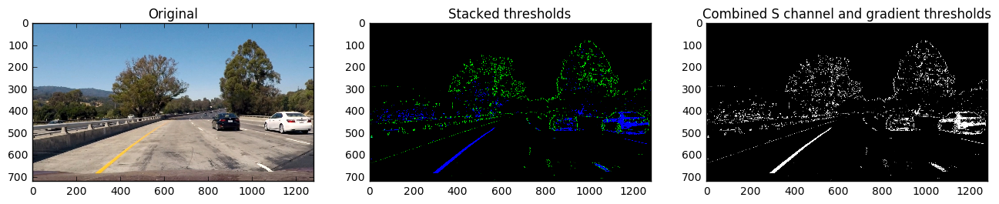

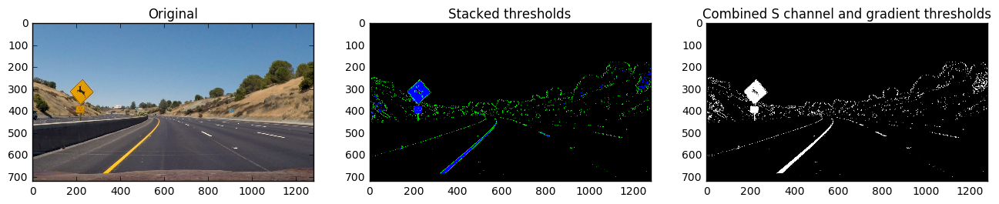

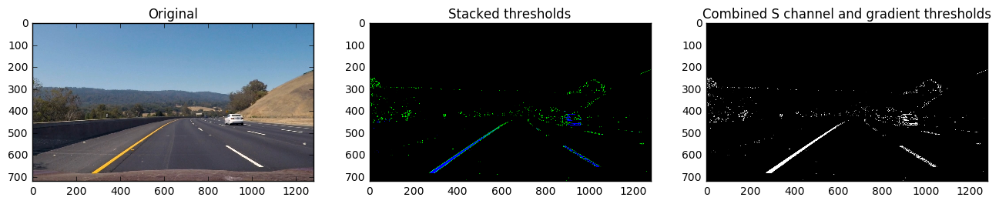

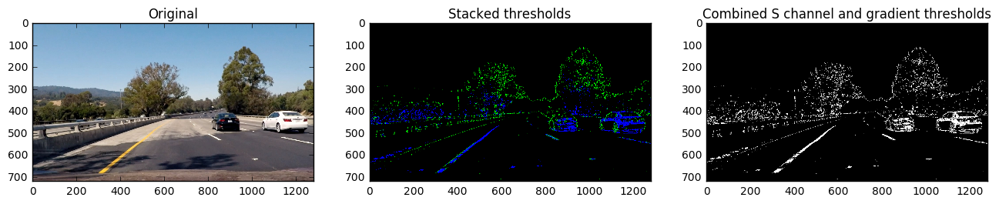

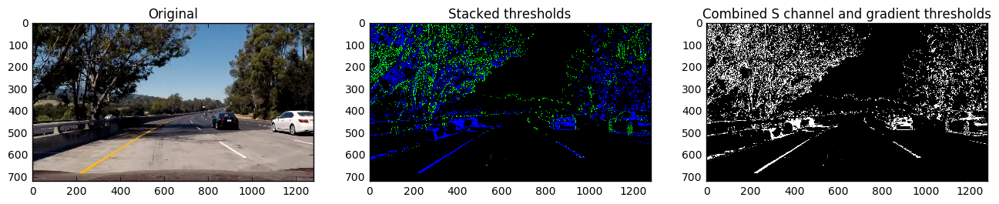

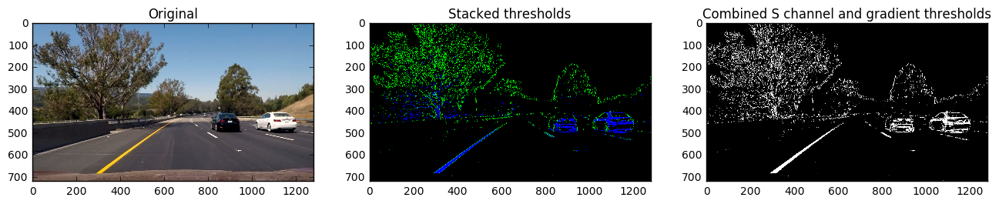

In [10]:
for testImg in glob.glob(os.path.join(TEST_IMG_DIR, '*.jpg')):
    
    image = mpimg.imread(testImg)
    image = np.copy(image)
    test_thrsh(image, sx_thresh, s_thresh)



# Perspective Transform

## Define Source and Destination Points for Warping

In [11]:
src = np.float32([
        [570, 450],
        [710, 450],
        [100, 660],
        [1180, 660]])

dst = np.float32([
        [0,0],
        [1280, 0],
        [0, 720],
        [1280, 720]])

## Test the Perspective Transform

In [12]:
def test_perspective(img, src, dst):
    M = cv2.getPerspectiveTransform(src, dst)
    undist = cv2.undistort(img, mtx, dist, None, None)
    warped = cv2.warpPerspective(undist, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    # Plotting thresholded images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Original')
    ax1.imshow(undist)
    symbol = 'o'
    size = 8
    ax1.plot(src[0][0], src[0][1], symbol, markersize=size)
    ax1.plot(src[1][0], src[1][1], symbol, markersize=size)
    ax1.plot(src[2][0], src[2][1], symbol, markersize=size)
    ax1.plot(src[3][0], src[3][1], symbol, markersize=size)

    ax2.set_title('Transform')
    ax2.imshow(warped)

    plt.show()

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\straight_lines1.jpg
(720, 1280, 3)


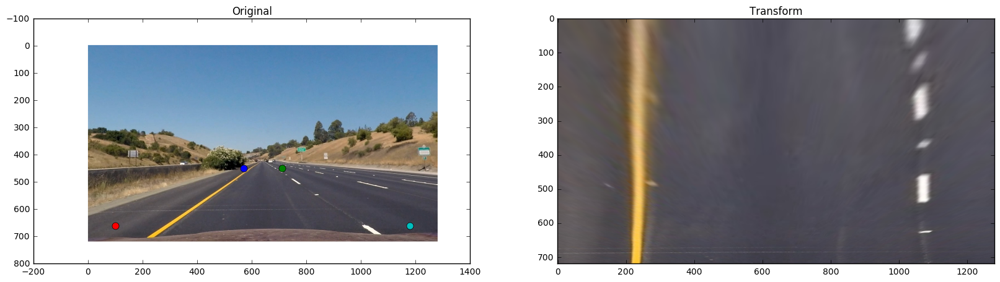

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\straight_lines2.jpg
(720, 1280, 3)


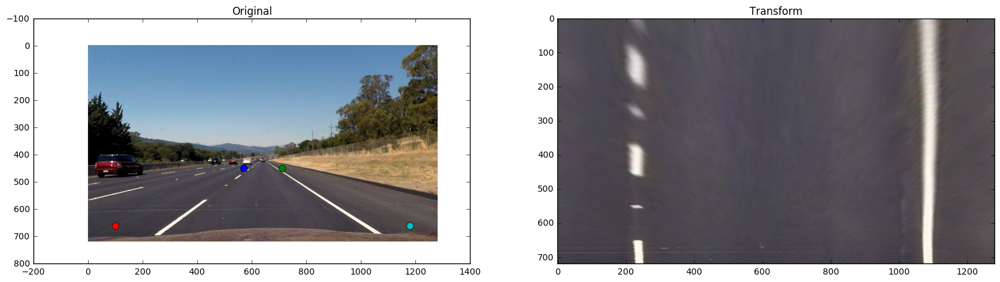

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test1.jpg
(720, 1280, 3)


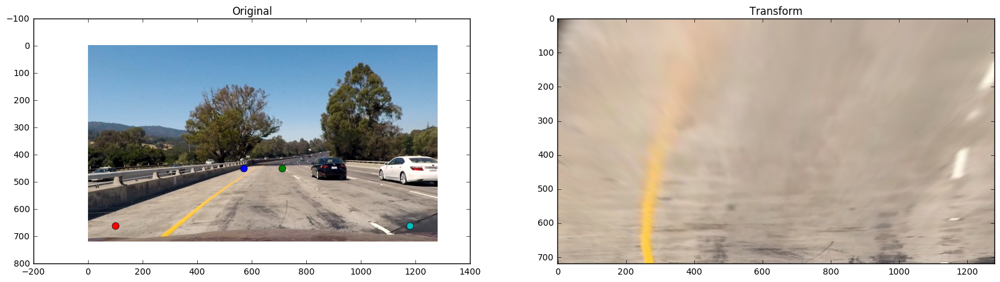

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test2.jpg
(720, 1280, 3)


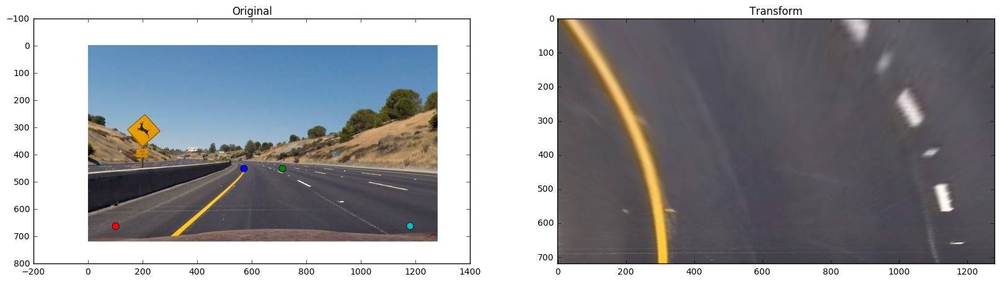

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test3.jpg
(720, 1280, 3)


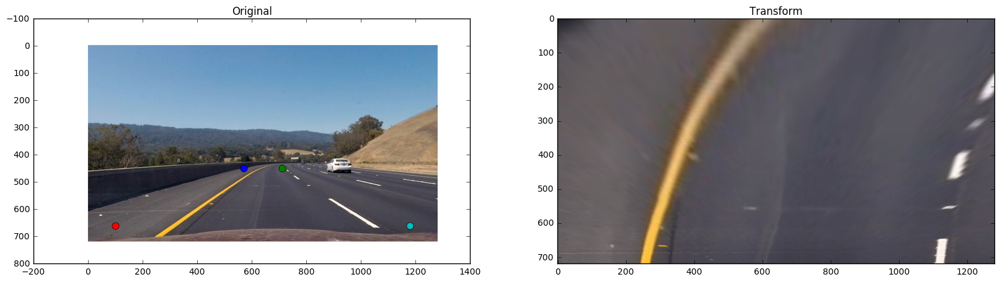

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test4.jpg
(720, 1280, 3)


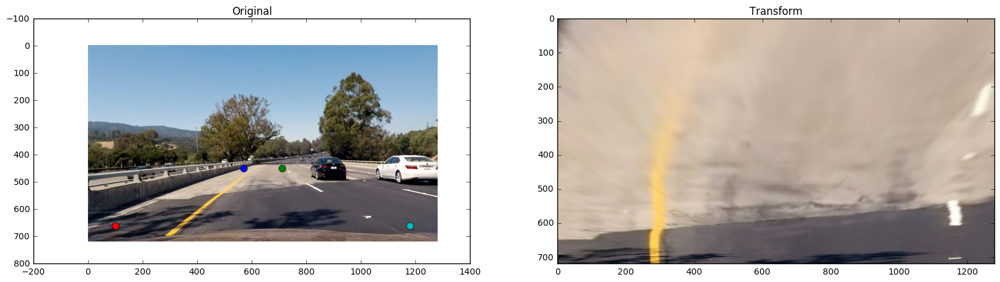

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test5.jpg
(720, 1280, 3)


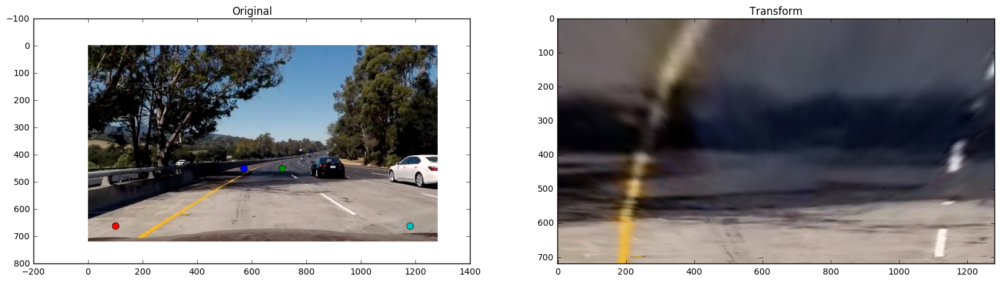

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test6.jpg
(720, 1280, 3)


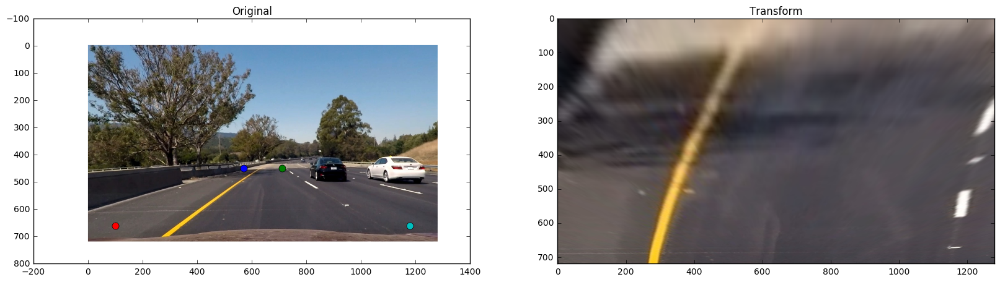

In [13]:
for testImg in glob.glob(os.path.join(TEST_IMG_DIR, '*.jpg')):
    print(testImg)
    image = mpimg.imread(testImg)
    print(image.shape)
    image = np.copy(image)
    test_perspective(image, src, dst)


## Save Perspective Transform Matrices

In [14]:
M = cv2.getPerspectiveTransform(src, dst)
Minv = cv2.getPerspectiveTransform(dst, src)
# apply like this:
# warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

## Test Threshhold and Perspective Transform Together

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\straight_lines1.jpg
(720, 1280, 3)


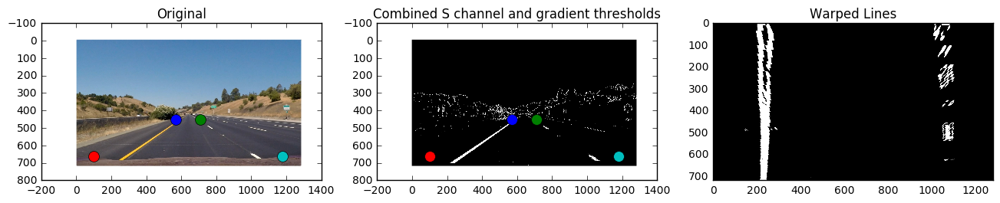

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\straight_lines2.jpg
(720, 1280, 3)


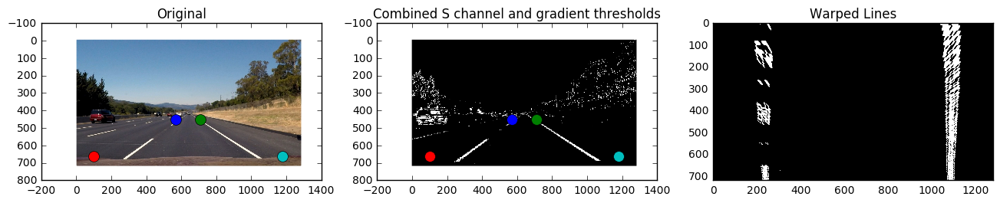

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test1.jpg
(720, 1280, 3)


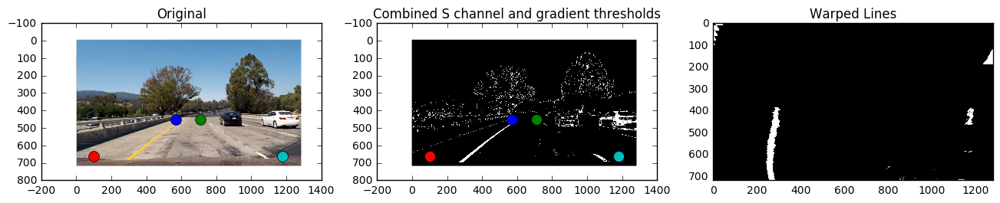

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test2.jpg
(720, 1280, 3)


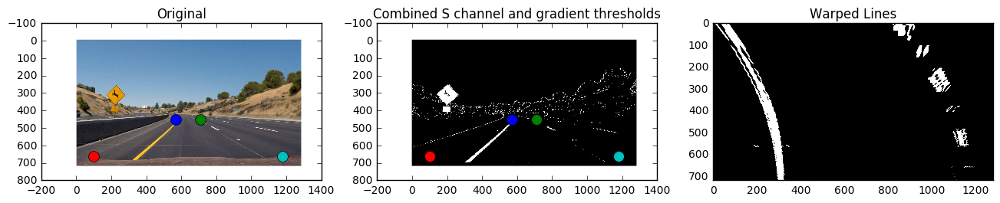

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test3.jpg
(720, 1280, 3)


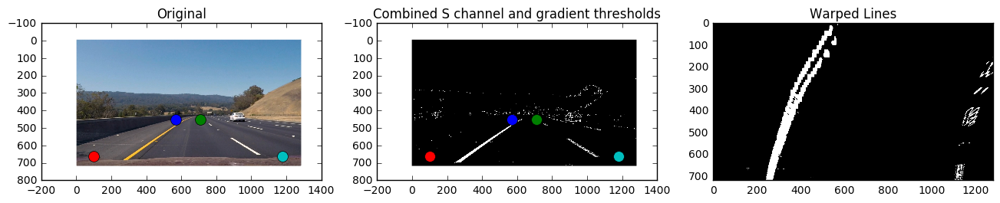

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test4.jpg
(720, 1280, 3)


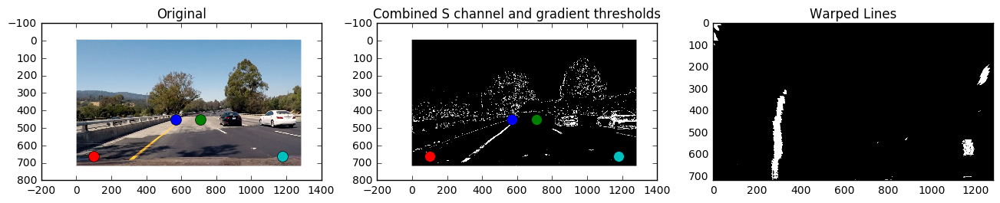

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test5.jpg
(720, 1280, 3)


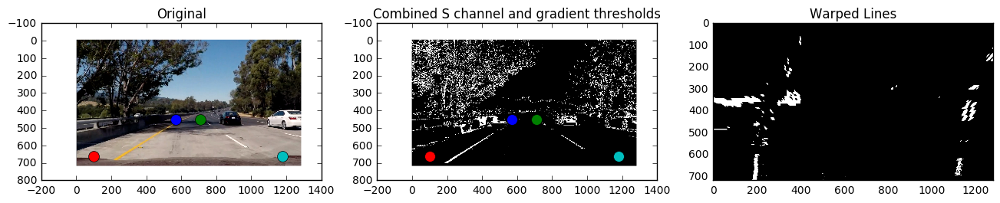

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test6.jpg
(720, 1280, 3)


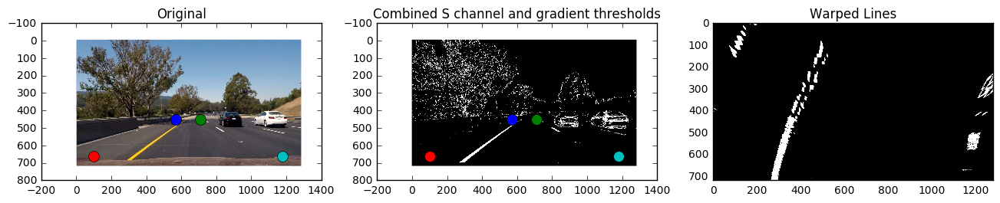

In [15]:
def test_comb(img, src, dst):
    undist = cv2.undistort(img, mtx, dist, None, None)
    color_binary, combined_binary = color_thrsh(undist, sx_thresh, s_thresh)
    warped = cv2.warpPerspective(combined_binary, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    # Plotting thresholded images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8))
    ax1.set_title('Original')
    ax1.imshow(img)
    symbol = 'o'
    size = 10
    ax1.plot(src[0][0], src[0][1], symbol, markersize=size)
    ax1.plot(src[1][0], src[1][1], symbol, markersize=size)
    ax1.plot(src[2][0], src[2][1], symbol, markersize=size)
    ax1.plot(src[3][0], src[3][1], symbol, markersize=size)

    ax2.set_title('Combined S channel and gradient thresholds')
    ax2.imshow(combined_binary, cmap='gray')
    ax2.plot(src[0][0], src[0][1], symbol, markersize=size)
    ax2.plot(src[1][0], src[1][1], symbol, markersize=size)
    ax2.plot(src[2][0], src[2][1], symbol, markersize=size)
    ax2.plot(src[3][0], src[3][1], symbol, markersize=size)

    ax3.set_title('Warped Lines')
    ax3.imshow(warped, cmap='gray')

    plt.show()
    
for testImg in glob.glob(os.path.join(TEST_IMG_DIR, '*.jpg')):
    print(testImg)
    image = mpimg.imread(testImg)
    print(image.shape)
    image = np.copy(image)
    test_comb(image, src, dst)

# Calculate Curvature

In [16]:
def calc_curvature(yval, xval):
    y_eval = np.max(yval)
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    
    # Fit new polynomials to x,y in world space
    fit_cr = np.polyfit(yval*ym_per_pix, xval*xm_per_pix, 2)
    # Calculate the new radii of curvature
    curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) / np.absolute(2*fit_cr[0])
    
    # return curvature and direction of curvature
    return round(curverad,2), 1 if fit_cr[0] > 0 else -1

# Detect Lines in Warped Image

In [17]:

def poly_fit(binary_warped, left_fit=None, right_fit=None):

    # Assuming you have created a warped binary image called "binary_warped"
    # Create an output image to draw on and  visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the width of the windows +/- margin
    margin = 100
    
    if left_fit != None and right_fit != None:
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) +
                                       left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                          (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                                       left_fit[1]*nonzeroy + left_fit[2] + margin))) 
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + 
                                        right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                           (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                                        right_fit[1]*nonzeroy + right_fit[2] + margin)))  
    else:
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[binary_warped.shape[0]/2:,:], axis=0)
        
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(binary_warped.shape[0]/nwindows)
        
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base

        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = binary_warped.shape[0] - (window+1)*window_height
            win_y_high = binary_warped.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Fit a second order polynomial to each
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    left_curverad, l_sign = calc_curvature(lefty, leftx)
    right_curverad, r_sign = calc_curvature(righty, rightx)
    
    return out_img, left_fit, right_fit, (left_curverad, l_sign), (right_curverad, r_sign)




## Test Line Detection

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\straight_lines1.jpg
(720, 1280, 3)


C:\Program Files\Anaconda3\lib\site-packages\ipykernel\__main__.py:27: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future


Curvarture:  -8465.33 m -1019.99 m
Parallel Offset:  24 px


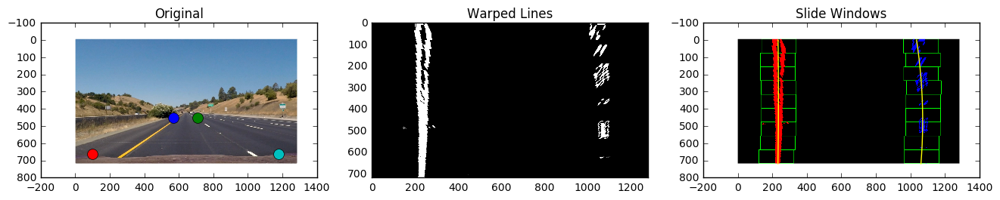

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\straight_lines2.jpg
(720, 1280, 3)
Curvarture:  10693.95 m -2275.18 m
Parallel Offset:  9 px


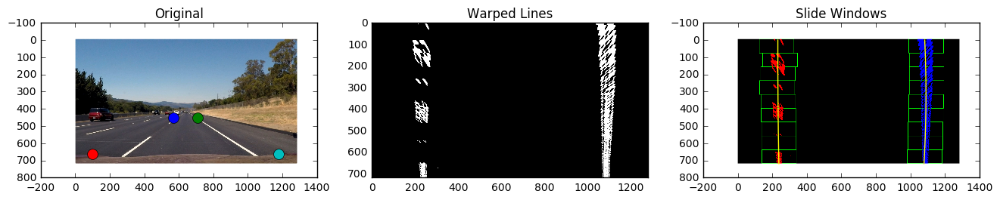

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test1.jpg
(720, 1280, 3)
Curvarture:  327.1 m 399.99 m
Parallel Offset:  7 px


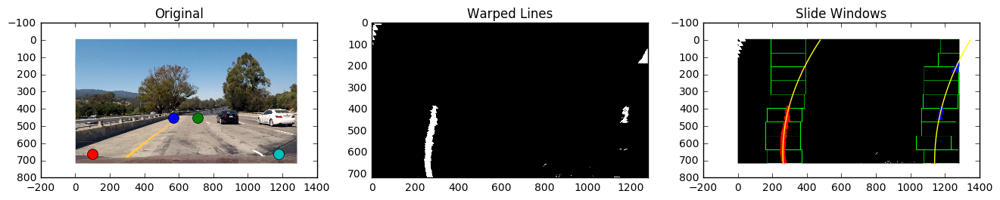

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test2.jpg
(720, 1280, 3)
Curvarture:  -340.59 m -335.89 m
Parallel Offset:  28 px


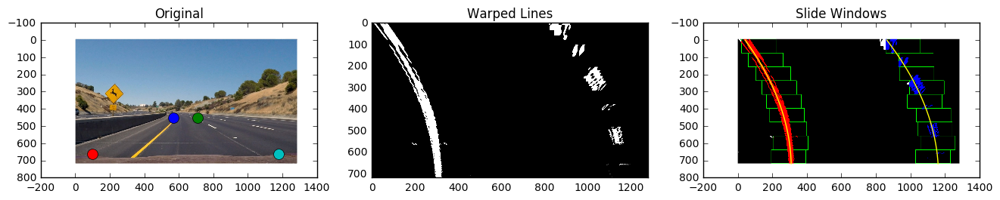

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test3.jpg
(720, 1280, 3)
Curvarture:  590.97 m 525.43 m
Parallel Offset:  53 px


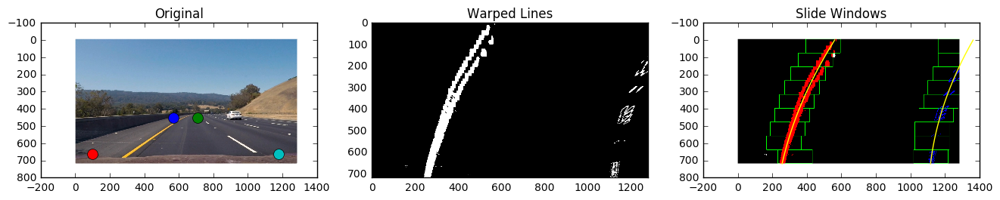

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test4.jpg
(720, 1280, 3)
Curvarture:  1034.72 m 326.78 m
Parallel Offset:  96 px


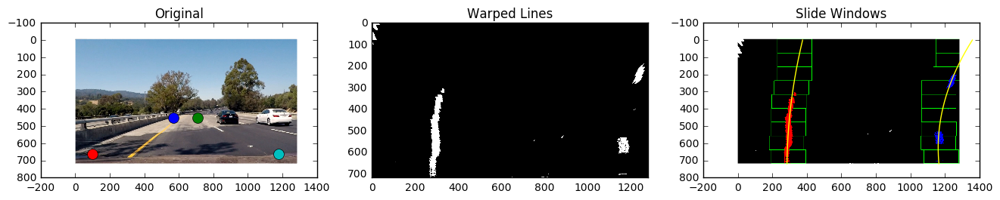

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test5.jpg
(720, 1280, 3)
Curvarture:  -200.27 m 361.12 m
Parallel Offset:  349 px


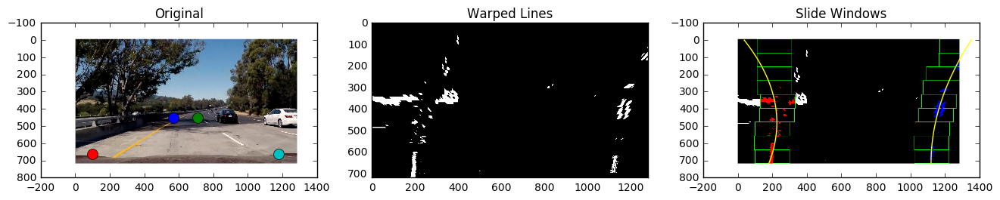

C:\Users\reinhard_steffens\Dropbox\Udacity\CarND-Advanced-Lane-Lines\test_images\test6.jpg
(720, 1280, 3)
Curvarture:  886.28 m 828.63 m
Parallel Offset:  74 px


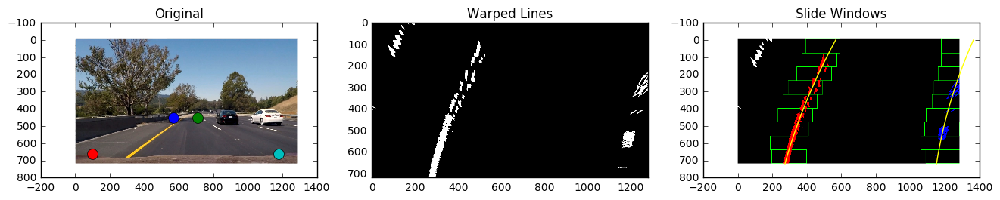

In [18]:
def test_poly_fit(img, src, dst):
    undist = cv2.undistort(img, mtx, dist, None, None)
    color_binary, combined_binary = color_thrsh(undist, sx_thresh, s_thresh)
    warped = cv2.warpPerspective(combined_binary, M, (img.shape[1], img.shape[0]), flags=cv2.INTER_LINEAR)
    
    # Plotting thresholded images
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16,8))
    ax1.set_title('Original')
    ax1.imshow(img)
    symbol = 'o'
    size = 10
    ax1.plot(src[0][0], src[0][1], symbol, markersize=size)
    ax1.plot(src[1][0], src[1][1], symbol, markersize=size)
    ax1.plot(src[2][0], src[2][1], symbol, markersize=size)
    ax1.plot(src[3][0], src[3][1], symbol, markersize=size)

    ax2.set_title('Warped Lines')
    ax2.imshow(warped, cmap='gray')

    ax2.set_title('Warped Lines')
    ax2.imshow(warped, cmap='gray')
    
    out_img, left_fit, right_fit, (lrad, lsign), (rrad, rsign) = poly_fit(warped)
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # measure if lanes are somewhat parallel
    dist_bottom = np.mean(right_fitx[:50]) - np.mean(left_fitx[:50])
    dist_top = np.mean(right_fitx[-50:]) - np.mean(left_fitx[-50:])
    par_offset = int(abs(dist_bottom - dist_top))
    
    print("Curvarture: ", lsign*lrad, 'm', rsign*rrad, 'm')
    print("Parallel Offset: ", par_offset, 'px')
    ax3.set_title('Slide Windows')
    ax3.imshow(out_img)
    ax3.plot(left_fitx, ploty, color='yellow')
    ax3.plot(right_fitx, ploty, color='yellow')
    #ax3.xlim(0, 1280)
    #ax3.ylim(720, 0)

    plt.show()
    
for testImg in glob.glob(os.path.join(TEST_IMG_DIR, '*.jpg')):
    print(testImg)
    image = mpimg.imread(testImg)
    print(image.shape)
    image = np.copy(image)
    test_poly_fit(image, src, dst)

# Pipeline for One Image

In [19]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        # smoothing constant
        self.smooth_over_nbr = 10.0
        # last fits
        self.left_fit = None
        self.right_fit = None

    def smooth(self, old_val, new_val):
        return (old_val * (self.smooth_over_nbr - 1) + new_val) / self.smooth_over_nbr
        
    def update_rad(self, new_rad):
        # smooth over N frames
        if self.radius_of_curvature:
            self.radius_of_curvature = round(self.smooth(self.radius_of_curvature, new_rad), 1)
        else:
            self.radius_of_curvature = new_rad
            
    def update_fit(self, l_or_r, new_fit):
        if l_or_r == 'left':
            if self.left_fit == None:
                self.left_fit = new_fit              
            else:
                self.left_fit = self.smooth(self.left_fit, new_fit)
        else:
            if self.right_fit == None:
                self.right_fit = new_fit
            else:
                self.right_fit = self.smooth(self.right_fit, new_fit)
    
    def update_line_base_pos(self, new_pos):
        if self.line_base_pos == None:
            self.line_base_pos = new_pos
        else:
            self.line_base_pos = round(self.smooth(self.line_base_pos, new_pos), 2)

In [27]:
LINE_OBJ = Line()

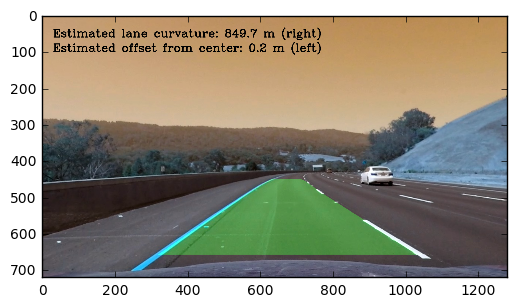

In [29]:
# Read in an image
img = cv2.imread(os.path.join(TEST_IMG_DIR, 'test3.jpg'))

def pipeline(image):
    global LINE_OBJ
    
    # undistort
    undist = cv2.undistort(image, mtx, dist, None, None)
    
    # apply thresholds
    color_binary, combined_binary = color_thrsh(undist, sx_thresh, s_thresh)
    
    # warp perspective
    warped = cv2.warpPerspective(combined_binary, M, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
    
    # fit poly
    try:
        _, left_fit, right_fit, (lrad, lsign), (rrad, rsign) = poly_fit(warped, LINE_OBJ.left_fit, LINE_OBJ.right_fit)
    except:
        left_fit = LINE_OBJ.left_fit
        right_fit = LINE_OBJ.right_fit
        (lrad, lsign) = (LINE_OBJ.radius_of_curvature, None)
        (rrad, rsign) = (LINE_OBJ.radius_of_curvature, None)
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    
    # calculate offset from lane center
    right_lane_pos = np.mean(right_fitx[-10:])
    left_lane_pos = np.mean(left_fitx[-10:])
    lane_center_pos = (right_lane_pos - left_lane_pos) / 2.0 + left_lane_pos
    x_offset = lane_center_pos - warped.shape[1] / 2  # this is the offset in px in warped image
    pix_fact = 3.7 / (right_lane_pos - left_lane_pos) # lanes are assumed to be 3.7 m appart
    x_offset_m = round(x_offset * pix_fact, 2)
    
    # measure confidence:
    # measure if lanes are somewhat parallel
    dist_bottom = np.mean(right_fitx[:50]) - np.mean(left_fitx[:50])
    dist_top = np.mean(right_fitx[-50:]) - np.mean(left_fitx[-50:])
    par_offset = int(abs(dist_bottom - dist_top))

    # trust a new computed data if the lines are somewhat paraellel and the
    # curvature somewhat agrees
    trust_new_data = True   
    if par_offset > 150:
        trust_new_data = False
    if lsign != rsign and lrad < 1500:
        trust_new_data = False
    
    # average radius
    avg_rad = lrad + rrad / 2

    # update Line obj
    # but only if we are confident of new values
    if trust_new_data or LINE_OBJ.left_fit == None:
        LINE_OBJ.update_rad(avg_rad)
        LINE_OBJ.update_fit('left', left_fit)
        LINE_OBJ.update_fit('right', right_fit)
        LINE_OBJ.update_line_base_pos(x_offset_m)

    # Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    # Recast the x and y points into usable format for cv2.fillPoly()
    ploty = np.linspace(0, warped.shape[0]-1, warped.shape[0] )
    left_fitx = LINE_OBJ.left_fit[0]*ploty**2 + LINE_OBJ.left_fit[1]*ploty + LINE_OBJ.left_fit[2]
    right_fitx = LINE_OBJ.right_fit[0]*ploty**2 + LINE_OBJ.right_fit[1]*ploty + LINE_OBJ.right_fit[2] 
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Put text with curvature on image
    font = cv2.FONT_HERSHEY_COMPLEX
    curve = 'straight'
    direction = ''
    if abs(LINE_OBJ.radius_of_curvature) < 3000:
        curve = '%s m' % (LINE_OBJ.radius_of_curvature)
        if lsign == -1:
            direction = ' (left)'
        else:
            direction = ' (right)'
    center_offset = ''
    if LINE_OBJ.line_base_pos > 0:
        center_offset = '%s m (left)' % (abs(LINE_OBJ.line_base_pos))
    else:
        center_offset = '%s m (right)' % (abs(LINE_OBJ.line_base_pos))
    cv2.putText(undist, 'Estimated lane curvature: %s%s' % (curve, direction), (30, 60), font, 1, (0,0,0), 2)
    cv2.putText(undist, 'Estimated offset from center: %s' % (center_offset), (30, 100), font, 1, (0,0,0), 2)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    return result

new_img = pipeline(img)
#print(new_img.shape)
plt.imshow(new_img)
plt.show()

# Video Testing

In [23]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [30]:
output = 'out_test.mp4'
clip1 = VideoFileClip(VIDEO_1)
LINE_OBJ = Line()
out_clip = clip1.fl_image(pipeline) #NOTE: this function expects color images!!
%time out_clip.write_videofile(output, audio=False)

[MoviePy] >>>> Building video out_test.mp4
[MoviePy] Writing video out_test.mp4


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [03:47<00:00,  4.73it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: out_test.mp4 

Wall time: 3min 50s


In [31]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(output))